# Brain Tumor Classification
### This project is made to detect brain tumor from image of brain CT-Scan or MRI
The Model classifies 3 types of tumors:
1. Glioma - Gliomas are cancerous brain tumours that start in glial cells. These are the supporting cells of the brain and the spinal cord. This type of tumour grows and spreads rapidly, often creating pressure.
2. Meningioma - Meningiomas are one of the most common forms of brain tumors, accounting for roughly 20% of brain tumors. They commonly form in areas populated with heavy amounts of arachnoid villi (located in the second layer which covers the brain).
3. Pituitary - Pituitary tumors are unusual growths that develop in the pituitary gland. This gland is an organ about the size of a pea. It's located behind the nose at the base of the brain. Some of these tumors cause the pituitary gland to make too much of certain hormones that control important body functions.

## Importing all decrepencies

In [59]:
import tensorflow as tf
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt

import seaborn as sns
import os
from tensorflow.keras import models, layers

## Fetching dataset of training data
Fetching total of 4 Classes of brain-tumor in the batch of 32 images each of size 256x256

In [43]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
"Training", shuffle=True, image_size=(256, 256), batch_size=32)
class_names = dataset.class_names
class_names

Found 5712 files belonging to 4 classes.


['glioma', 'meningioma', 'notumor', 'pituitary']

## Visualize some of the images from the dataset

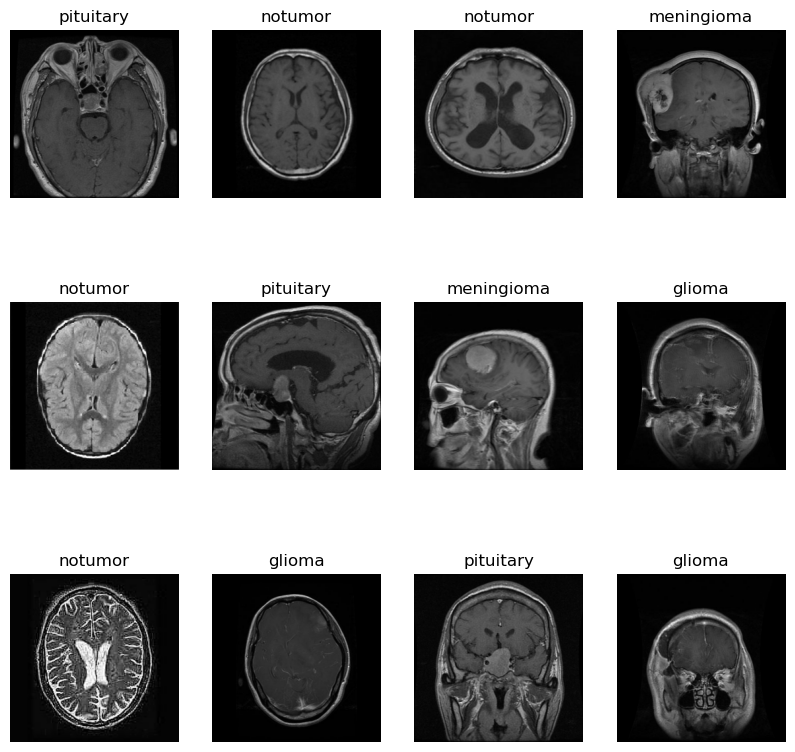

In [44]:
plt.figure(figsize=(10, 10))
for image_batch, labels_batch in dataset.take(1):
    for i in range(12):
        ax = plt.subplot(3, 4, i + 1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[labels_batch[i]])
        plt.axis("off")

## Function to Split Dataset

Dataset is bifurcated into 3 subsets, namely:
1. Training: Dataset to be used while training
2. Validation: Dataset to be tested against while training
3. Test: Dataset to be tested against after we trained a model

In [45]:
train_size = 0.8

train_dataset = dataset.take(143)

test_dataset = dataset.skip(143)

val_size = 0.1

val_dataset = test_dataset.take(18)

test_dataset = test_dataset.skip(18)

In [46]:
def get_dataset_partitions_tf(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):
    assert (train_split + test_split + val_split) == 1
    
    ds_size = len(ds)
    
    if shuffle:
        ds = ds.shuffle(shuffle_size, seed=12)
    
    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)
    
    train_ds = ds.take(train_size)    
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)
    
    return train_ds, val_ds, test_ds

### Splitting data into 3 sets (training data, validation data, test data)

In [47]:
np.random.seed(42)
train_dataset, val_dataset, test_dataset = get_dataset_partitions_tf(dataset)

## Cache, Shuffle, and Prefetch the Dataset
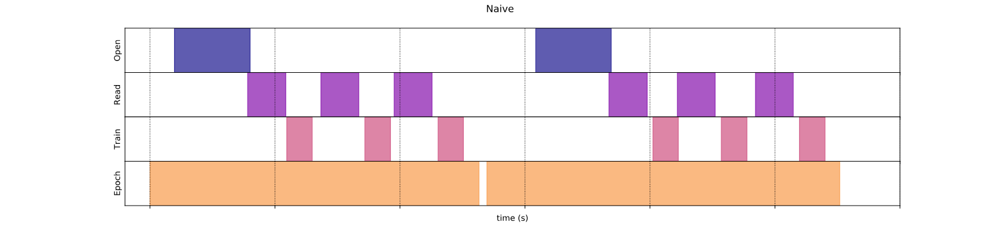
Prefetching overlaps the preprocessing and model execution of a training step. While the model is executing training step s, the input pipeline is reading the data for step s+1. Doing so reduces the step time to the maximum (as opposed to the sum) of the training and the time it takes to extract the data.
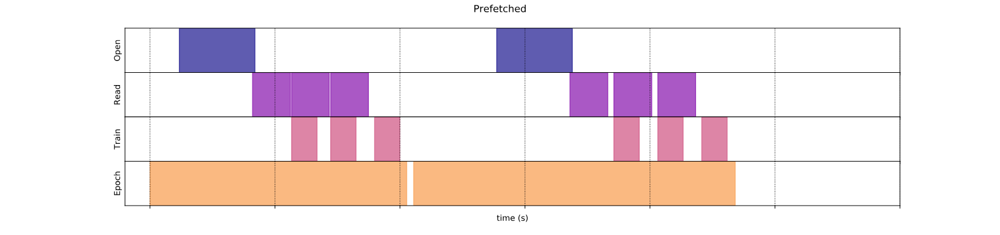


In [48]:
train_dataset = train_dataset.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_dataset = val_dataset.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_dataset = test_dataset.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

## Creating a Layer for Resizing and Normalization
Before we feed our images to network, we should be resizing it to the desired size. Moreover, to improve model performance, we should normalize the image pixel value (keeping them in range 0 and 1 by dividing by 256). This should happen while training as well as inference. Hence we can add that as a layer in our Sequential Model.

But, why do we need to resize (256,256) image to again (256,256). We don't need to but this will be useful when we are done with the training and start using the model for predictions. At that time somone can supply an image that is not (256,256) and this layer will resize it

In [49]:
resize_and_rescale = tf.keras.Sequential([
  layers.experimental.preprocessing.Resizing(256, 256),
  layers.experimental.preprocessing.Rescaling(1./255),
])

## Data Augmentation
Data Augmentation is needed when we have less data, this boosts the accuracy of our model by augmenting the data.

In [50]:
data_augmentation = tf.keras.Sequential([
  layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
  layers.experimental.preprocessing.RandomRotation(0.2),
])

## Model Architecture
Using Convolutional Neural Network (CNN)

A Convolutional Neural Network (CNN) is a specialized type of deep neural network designed for processing and analyzing visual data, such as images and videos. It is particularly well-suited for tasks like image recognition, object detection, and image classification due to its ability to automatically learn hierarchical features from input data.

The key innovation of CNNs lies in their architecture, which incorporates convolutional layers. These layers apply convolutional operations to input data. Convolution involves sliding a small filter (also known as a kernel) over the input image, performing element-wise multiplication and then summing the results. This operation helps capture local patterns and features in the image, such as edges, textures, and shapes. Convolutional layers also include other operations like pooling (often max pooling) to reduce spatial dimensions and further abstract the learned features.

CNNs consist of multiple layers, including convolutional layers, pooling layers, and fully connected layers. The convolutional and pooling layers focus on feature extraction, while the fully connected layers at the end of the network are responsible for making predictions based on the learned features.

In [51]:
input_shape = (32, 256, 256, 3)
n_classes = 4

model = models.Sequential([
    resize_and_rescale,
    layers.Conv2D(32, kernel_size = (3,3), activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(n_classes, activation='softmax'),
])

model.build(input_shape=input_shape)
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_3 (Sequential)   (32, 256, 256, 3)         0         
                                                                 
 conv2d_6 (Conv2D)           (32, 254, 254, 32)        896       
                                                                 
 max_pooling2d_6 (MaxPooling  (32, 127, 127, 32)       0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (32, 125, 125, 64)        18496     
                                                                 
 max_pooling2d_7 (MaxPooling  (32, 62, 62, 64)         0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (32, 60, 60, 64)         

## Comipling and Fitting data into the model
SparseCategoricalCrossentropy Computes the crossentropy loss between the labels and predictions.

Adam optimization is a stochastic gradient descent method that is based on adaptive estimation of first-order and second-order moments. It is a powerful tool for improving the accuracy and speed of deep learning models.

An epoch in machine learning means one complete pass of the training dataset through the algorithm. This epoch's number is an important hyperparameter for the algorithm. It specifies the number of epochs or complete passes of the entire training dataset passing through the training or learning process of the algorithm.
For this model, we would be using 20 epochs (Chosen by hit and trail method keeping accuracy and time taken for prediction in mind).


In [52]:
model.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(), optimizer=tf.keras.optimizers.Adam(), metrics=["accuracy"])

history = model.fit(
    train_dataset,
    batch_size = 32,
    validation_data = val_dataset,
    verbose = 1,
    epochs = 20,
)

Epoch 1/20
143/143 [==============================] - 76s 523ms/step - loss: 0.8991 - accuracy: 0.5954 - val_loss: 0.5654 - val_accuracy: 0.7794
Epoch 2/20
143/143 [==============================] - 76s 533ms/step - loss: 0.4745 - accuracy: 0.8254 - val_loss: 0.4905 - val_accuracy: 0.7996
Epoch 3/20
143/143 [==============================] - 77s 542ms/step - loss: 0.3578 - accuracy: 0.8702 - val_loss: 0.2760 - val_accuracy: 0.9062
Epoch 4/20
143/143 [==============================] - 80s 558ms/step - loss: 0.2932 - accuracy: 0.8930 - val_loss: 0.3449 - val_accuracy: 0.8603
Epoch 5/20
143/143 [==============================] - 84s 590ms/step - loss: 0.2210 - accuracy: 0.9195 - val_loss: 0.2171 - val_accuracy: 0.9301
Epoch 6/20
143/143 [==============================] - 84s 585ms/step - loss: 0.1609 - accuracy: 0.9436 - val_loss: 0.1303 - val_accuracy: 0.9540
Epoch 7/20
143/143 [==============================] - 83s 582ms/step - loss: 0.1200 - accuracy: 0.9570 - val_loss: 0.1304 - val_ac

## Test Evaluation
Testing the model with 10% of the test_dataset to check accuracy and loss of the prediction
### [loss, accuracy]
#### [0.06401616334915161, 0.9851973652839661]

In [53]:
scores = model.evaluate(test_dataset)
scores

19/19 [==============================] - 4s 146ms/step - loss: 0.0284 - accuracy: 0.9885


[0.028393134474754333, 0.9884868264198303]

In [54]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

### Ploting graph to visualize loss and accuracy on training and validation data

<IPython.core.display.Javascript object>


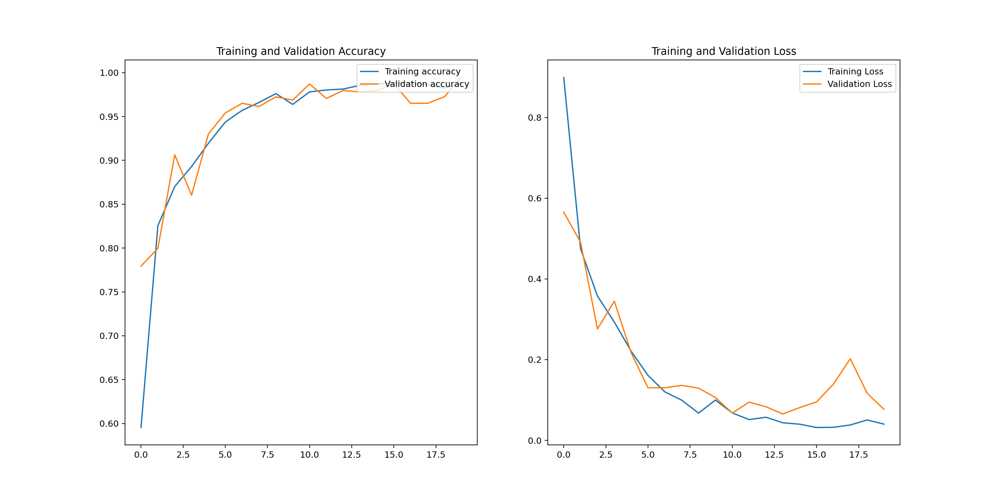

In [64]:
%matplotlib notebook

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(range(20), acc, label='Training accuracy')
plt.plot(range(20), val_acc, label='Validation accuracy')
plt.legend(loc='upper right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(20), loss, label='Training Loss')
plt.plot(range(20), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()
plt.savefig('graph.png')

## Running prediction on a sample image

<IPython.core.display.Javascript object>


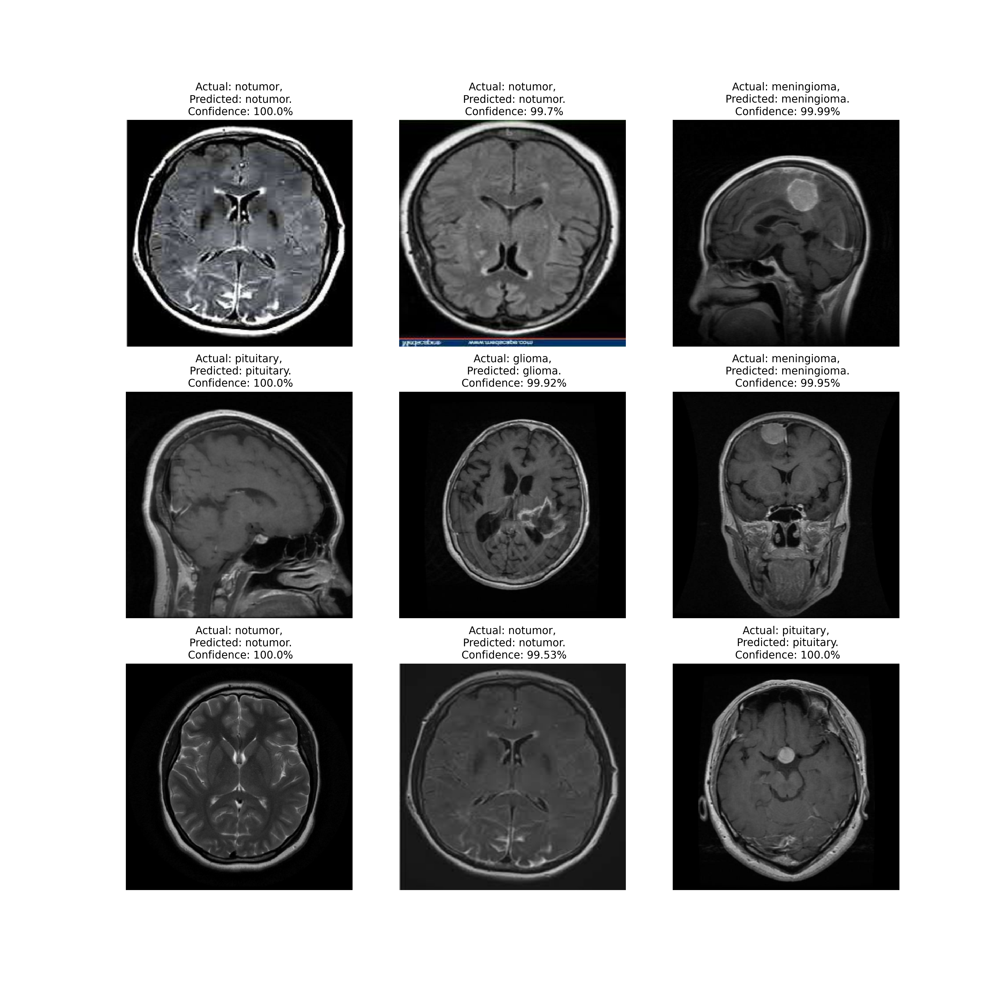

1/1 [==============================] - 0s 14ms/step


In [65]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

plt.figure(figsize=(16, 16))
for images, labels in test_dataset.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off") 
    plt.savefig('sample_predictions.png')

## Visualizing 1st layer using heatmap
This shows how 1st layer of the image filters provided is read and studied by the model 
Total 32 filters are being studing per layer

conv2d_6 (3, 3, 3, 32)


<IPython.core.display.Javascript object>


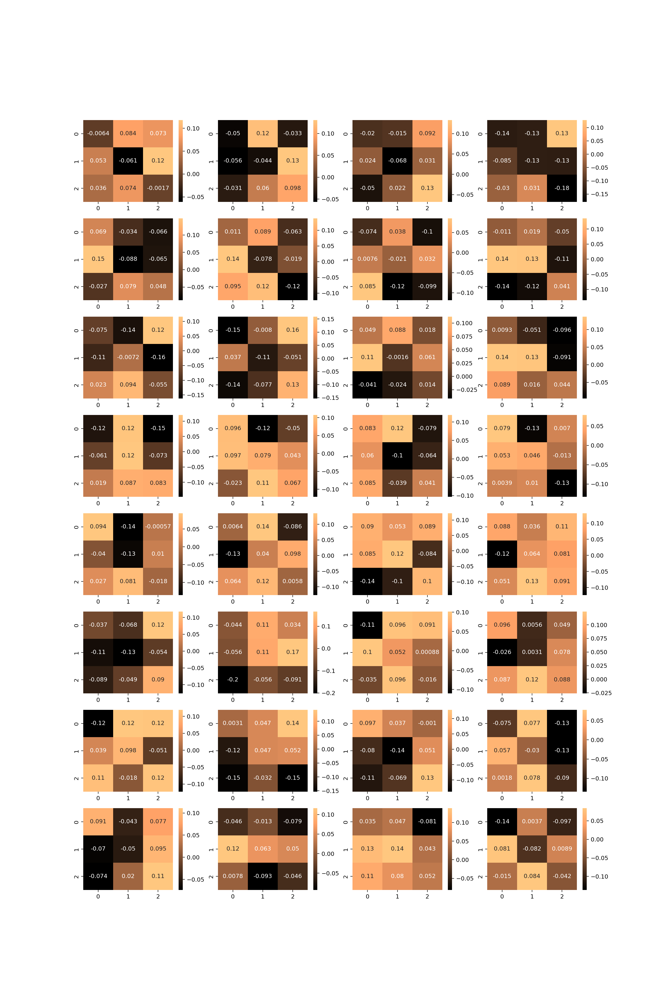

In [66]:
layer = model.layers #Conv layers at 1, 3, 5, 7, 9, 11
filters, biases = model.layers[1].get_weights()
print(layer[1].name, filters.shape)

fig1 = plt.figure(figsize=(16, 24))
columns = 4
rows = 8
n_filters = columns * rows
for i in range(1, n_filters + 1):
    f = filters[:, :, :, i-1]
    fig1 = plt.subplot(rows, columns, i)
    fig1.set_xticks([])
    fig1.set_yticks([])
    sns.heatmap(f[:, :, 0], cmap='copper', annot=True)
plt.savefig('layer_heatmap.png')


## Visualizing Sample Image of Glioma tumor studied by the model

1/1 [==============================] - 0s 43ms/step


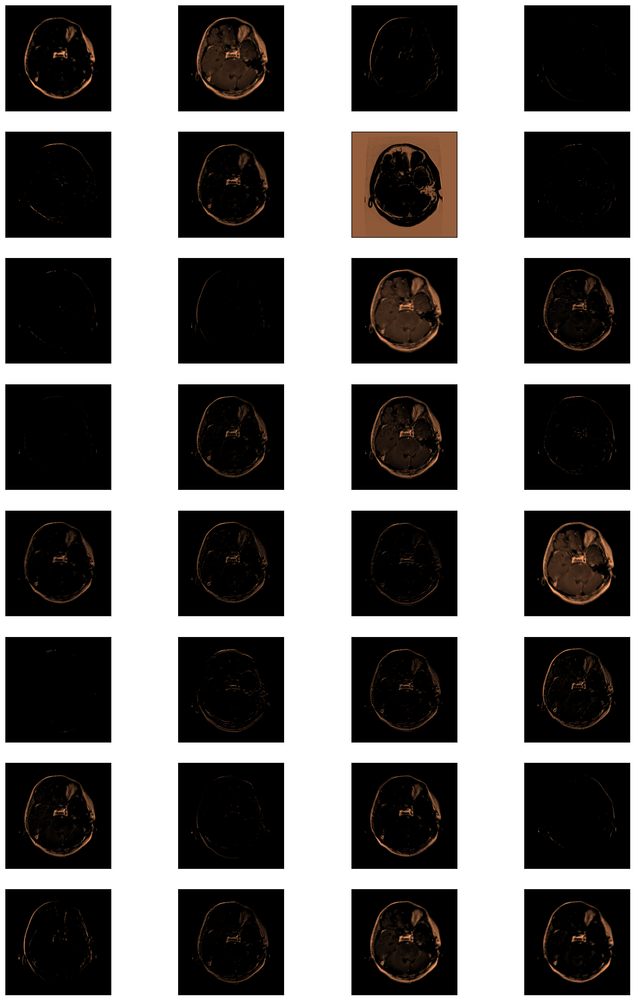

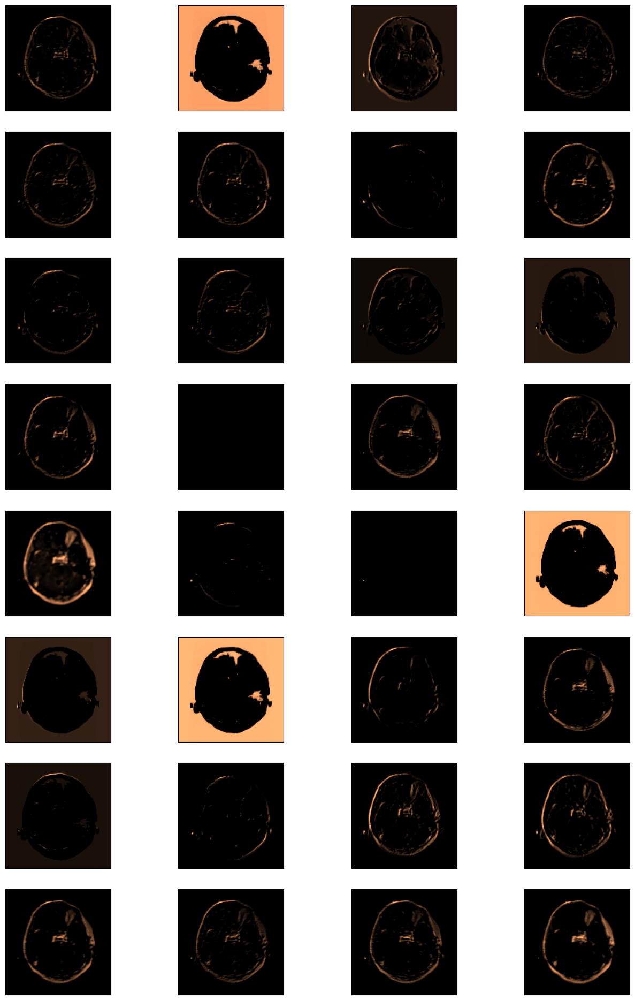

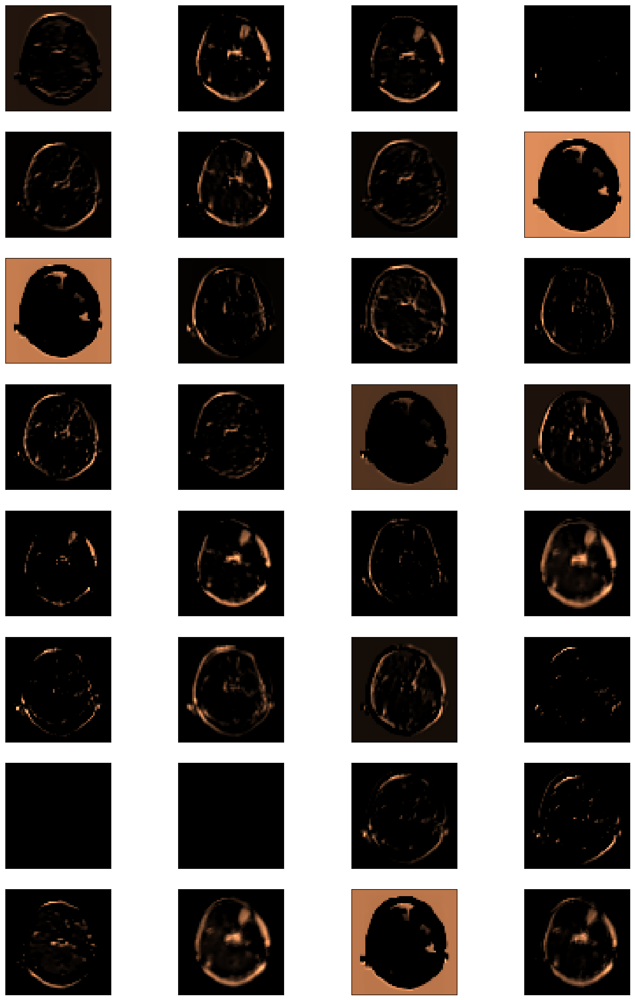

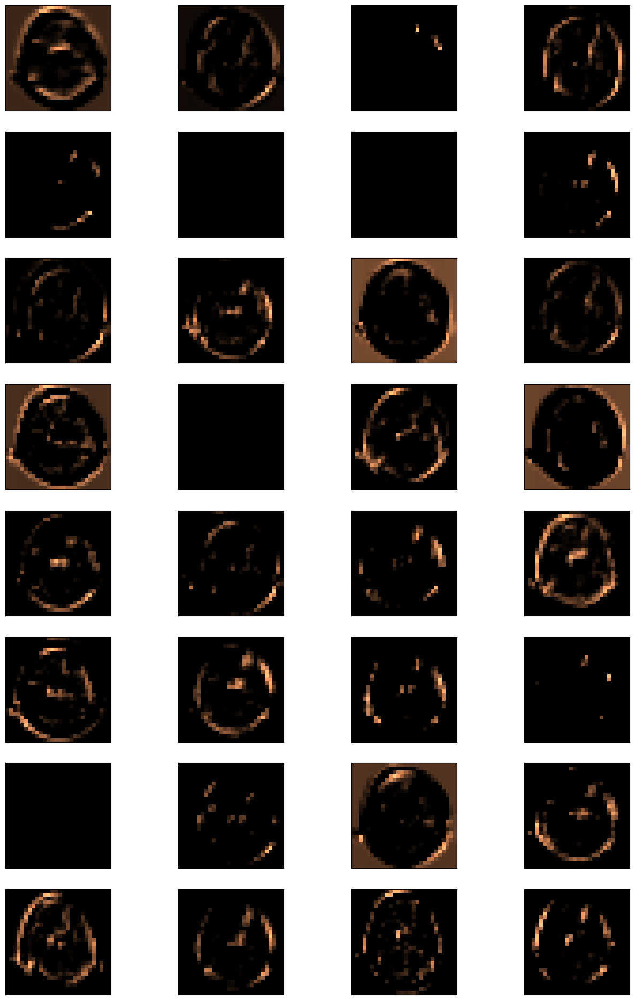

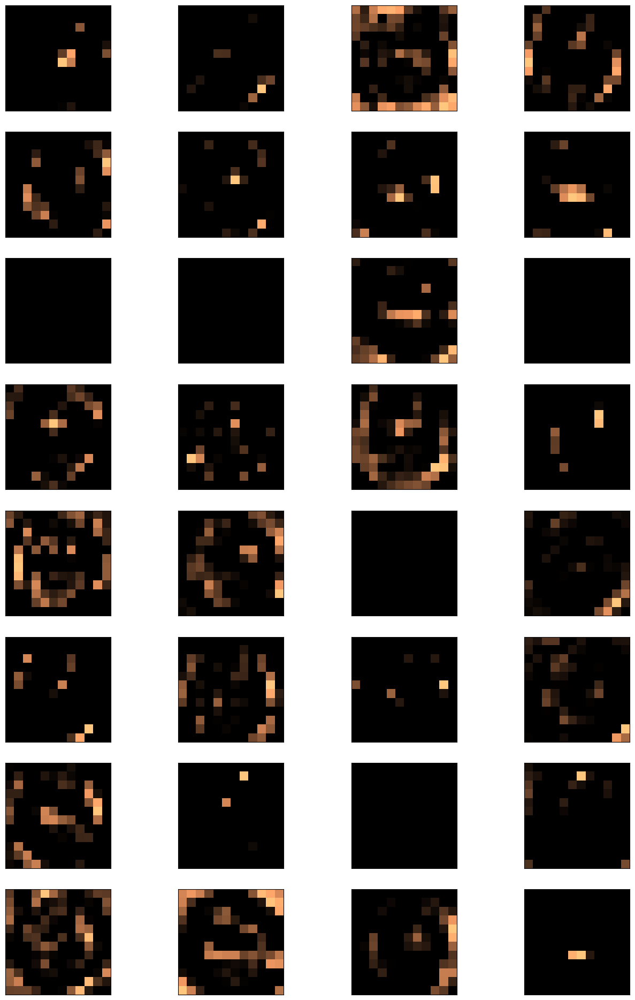

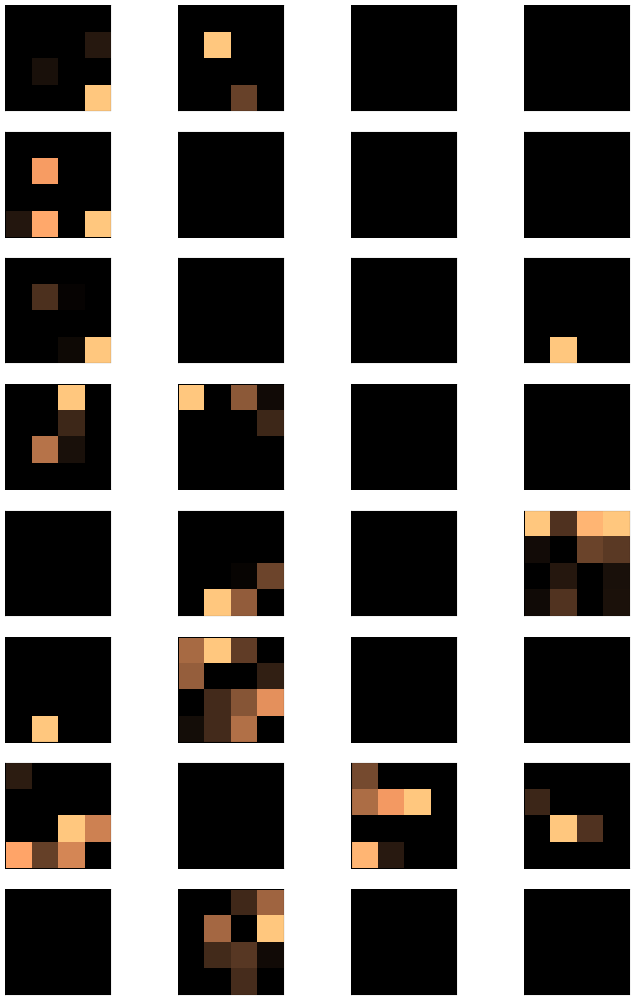

In [108]:
from keras.models import Model
conv_layer_index = [1, 3, 5, 7, 9, 11]
outputs = [model.layers[i].output for i in conv_layer_index]
model_short = Model(inputs=model.inputs, outputs=outputs)

from tensorflow.keras.utils import load_img, img_to_array
%matplotlib inline
img = load_img("./Testing/glioma/Te-gl_0010.jpg", target_size=(256, 256)) 
img = img_to_array(img)
img = np.expand_dims(img, axis=0)
feature_output = model_short.predict(img)
columns = 4
rows = 8
for ftr in feature_output:
    fig = plt.figure(figsize=(16, 24))
    for i in range(1, columns*rows +1):
        fig = plt.subplot(rows, columns, i)
        fig.set_xticks([])
        fig.set_yticks([])
        plt.imshow(ftr[0, :, :, i-1], cmap='copper')
    plt.show()


    



## Visualizing Sample Image of Pituitary tumor studied by the model

1/1 [==============================] - 0s 20ms/step


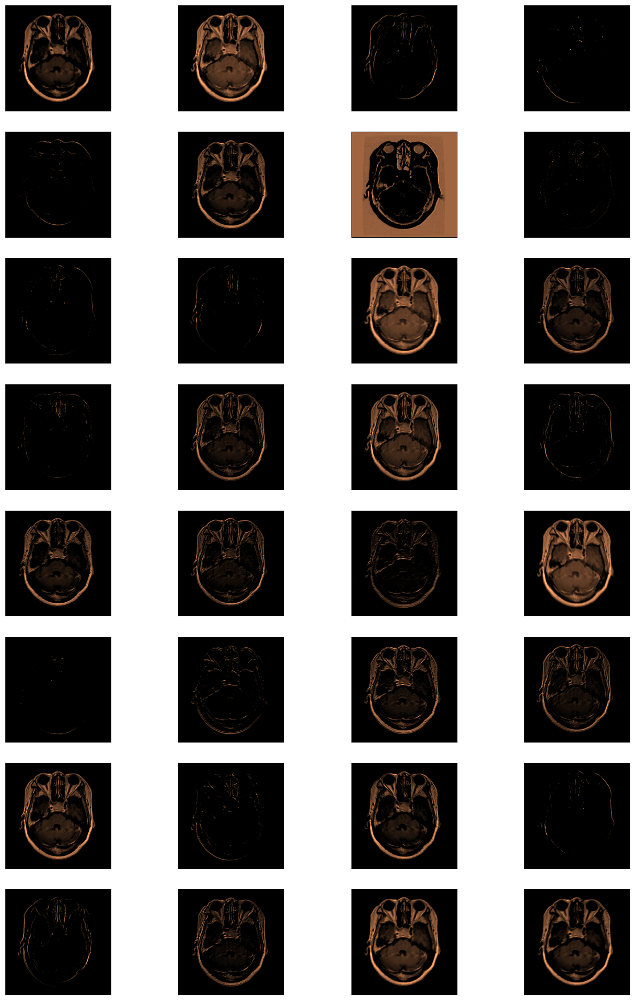

<Figure size 640x480 with 0 Axes>

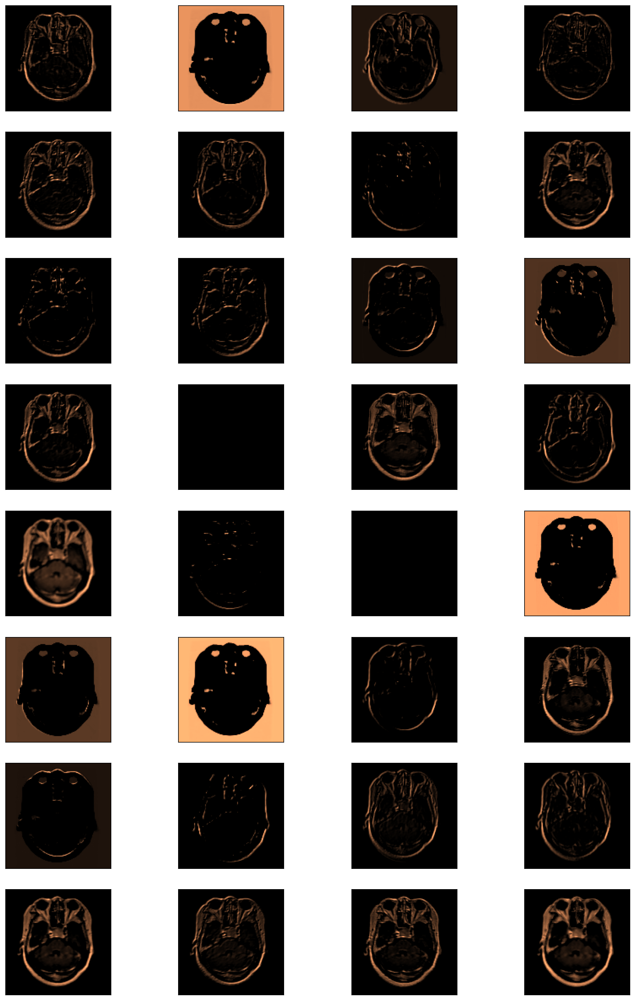

<Figure size 640x480 with 0 Axes>

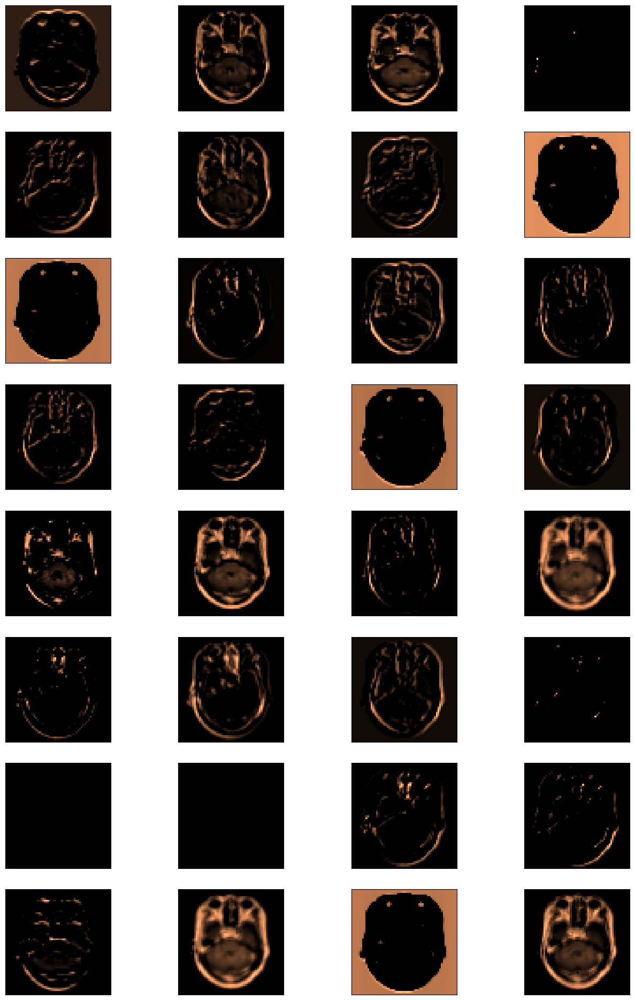

<Figure size 640x480 with 0 Axes>

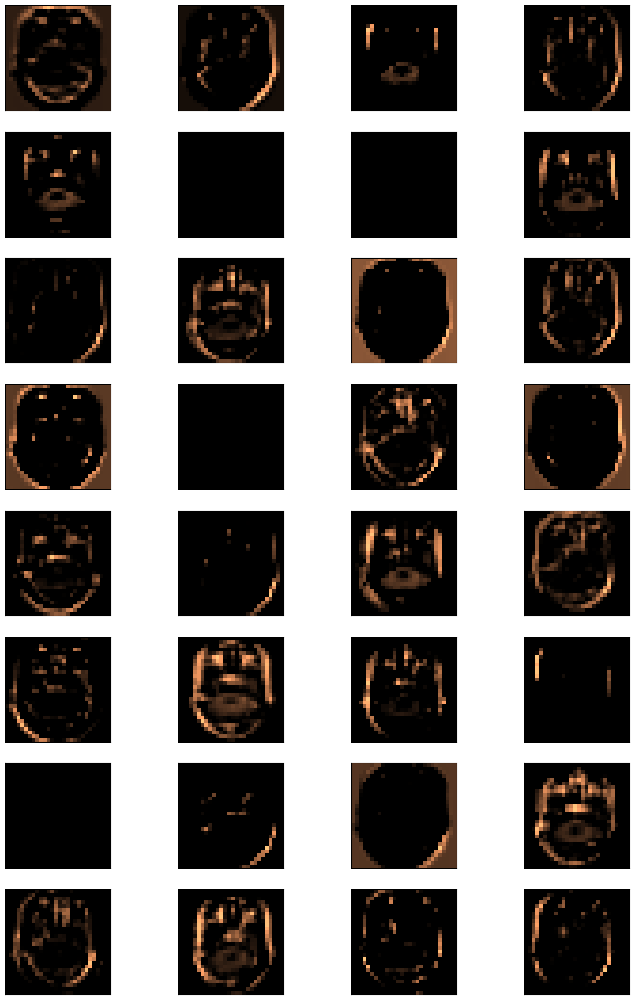

<Figure size 640x480 with 0 Axes>

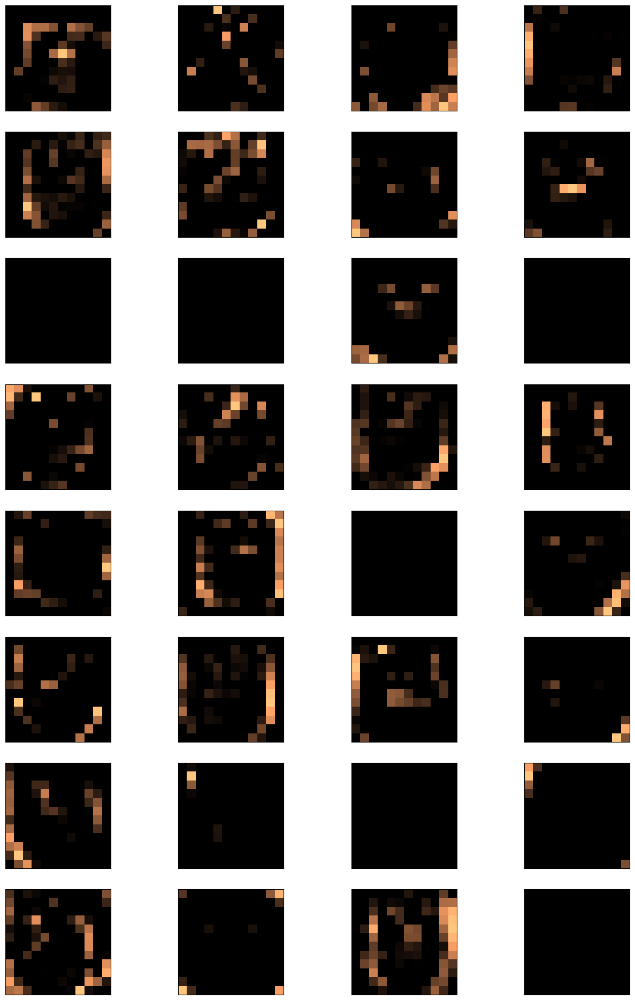

<Figure size 640x480 with 0 Axes>

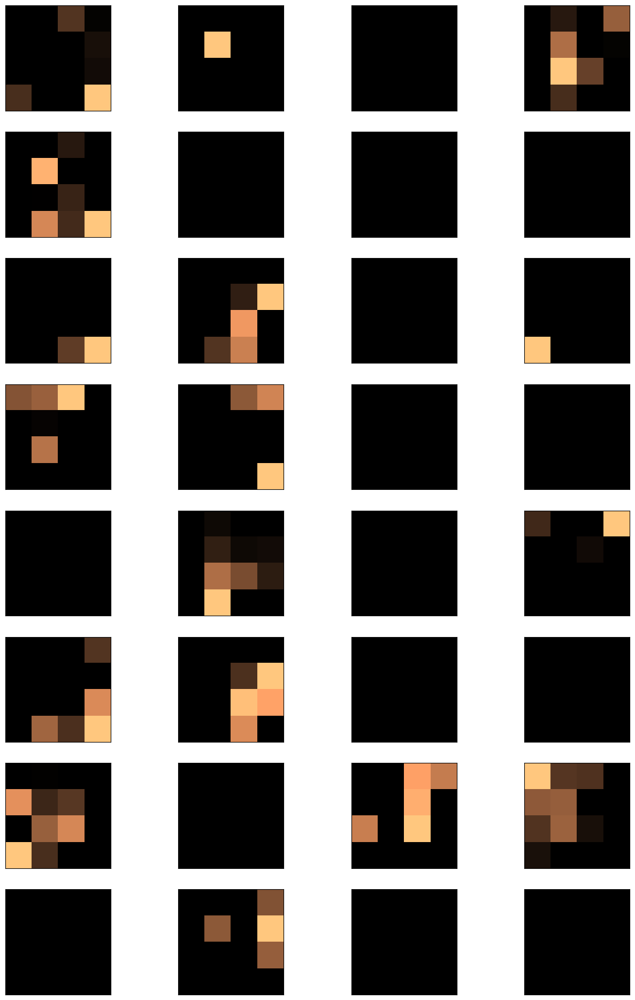

<Figure size 640x480 with 0 Axes>

In [109]:
from tensorflow.keras.utils import load_img, img_to_array
img = load_img("./Testing/pituitary/Te-pi_0017.jpg", target_size=(256, 256)) 
img = img_to_array(img)
img = np.expand_dims(img, axis=0)
feature_output = model_short.predict(img)
columns = 4
rows = 8
for ftr in feature_output:
    fig=plt.figure(figsize=(16, 24))
    for i in range(1, columns*rows +1):
        fig =plt.subplot(rows, columns, i)
        fig.set_xticks([])
        fig.set_yticks([])
        plt.imshow(ftr[0, :, :, i-1], cmap='copper')
    plt.show()
    plt.savefig('sample_pituitary_visual.png')


## Visualizing Sample Image of Meningioma tumor studied by the model

1/1 [==============================] - 0s 22ms/step


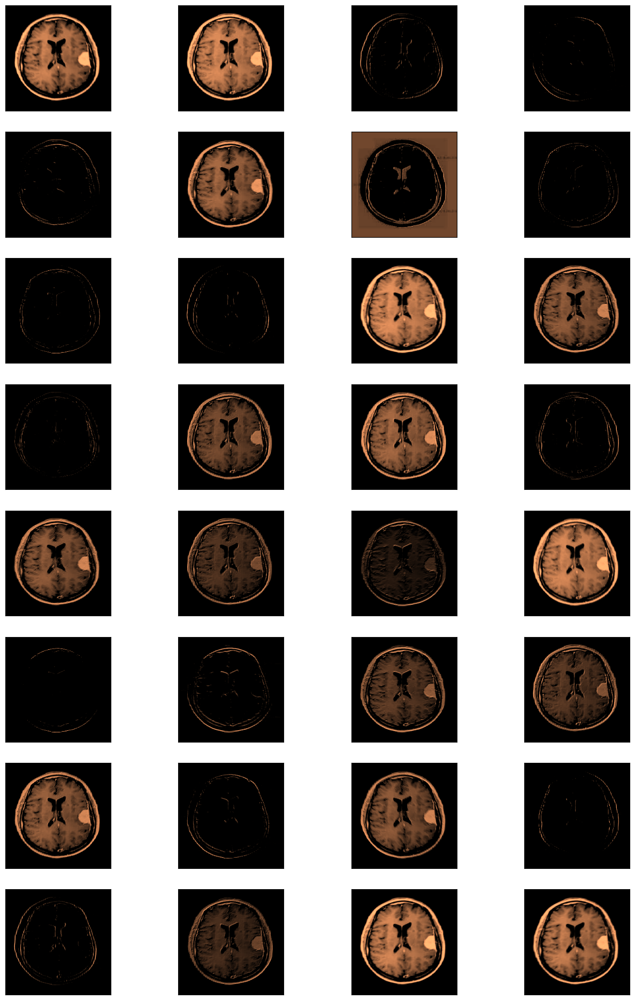

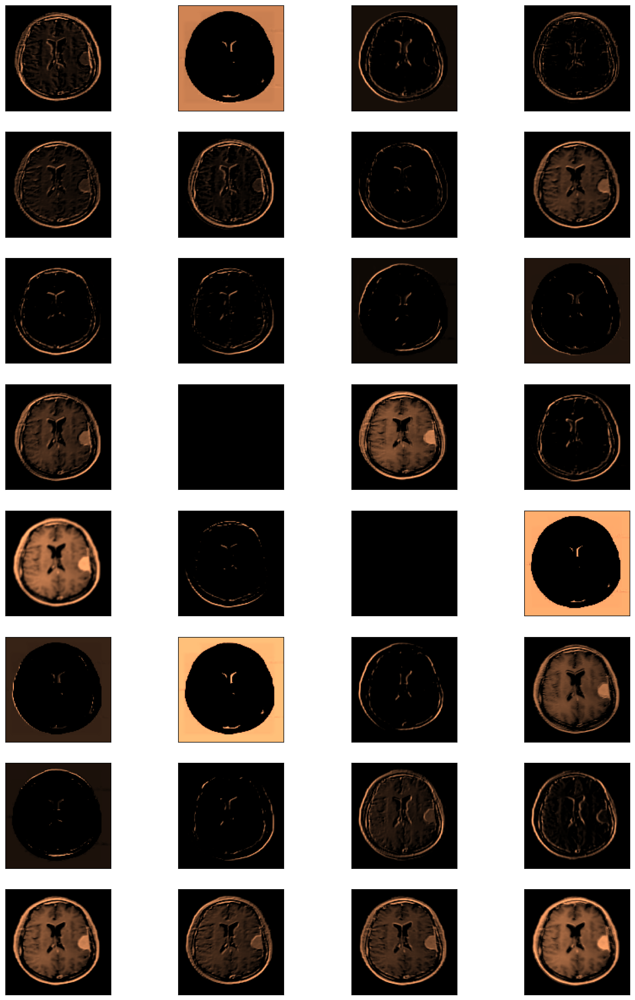

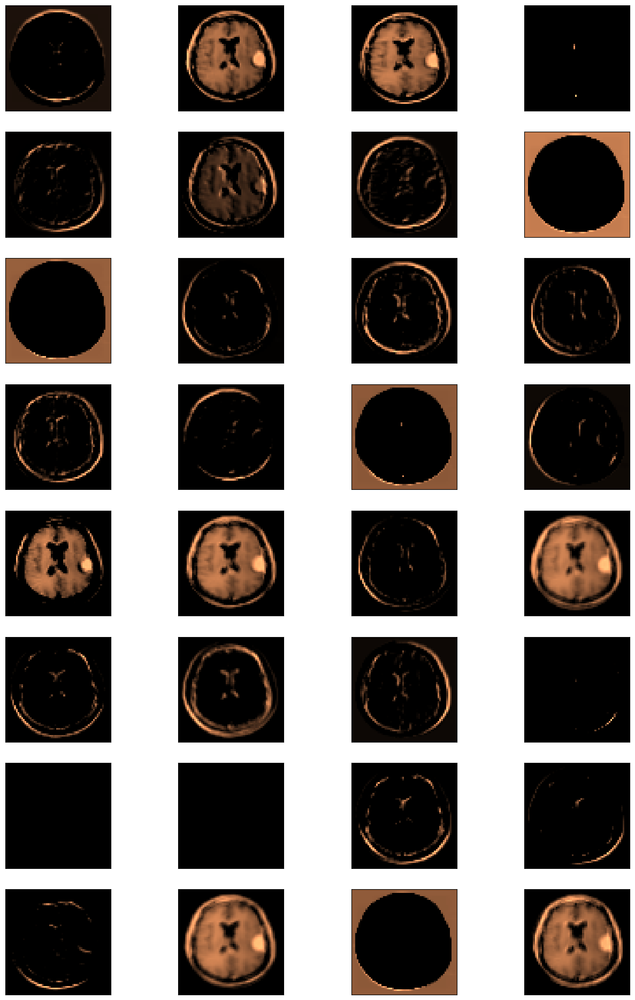

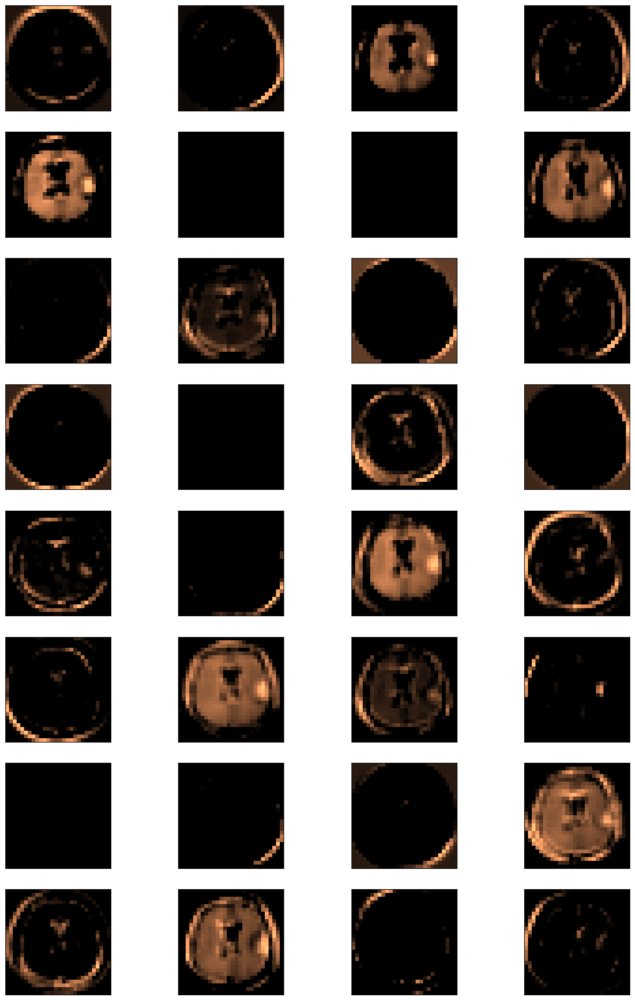

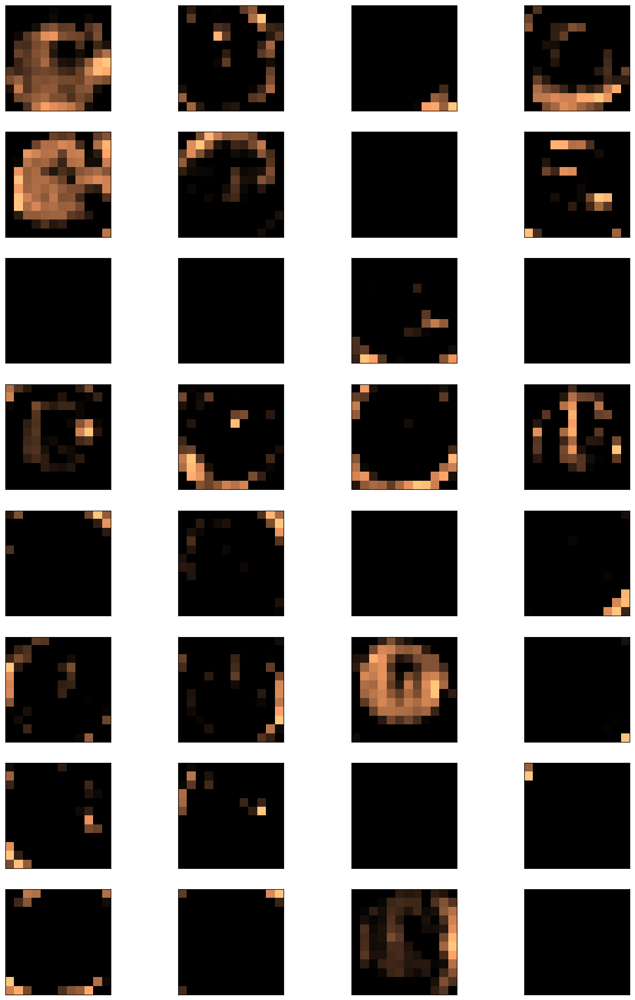

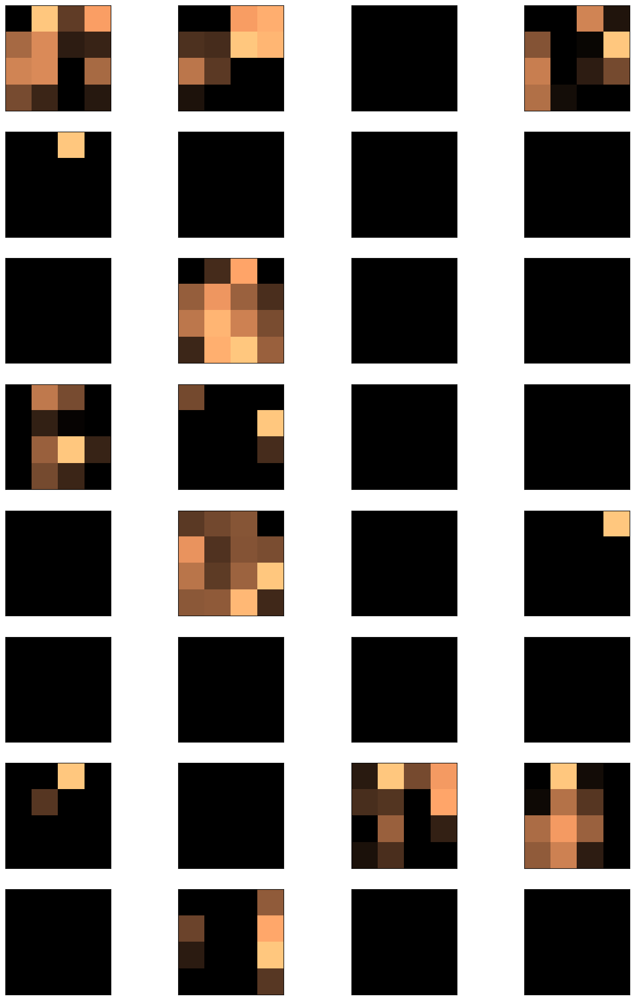

In [110]:
from tensorflow.keras.utils import load_img, img_to_array
img = load_img("./Testing/meningioma/Te-me_0143.jpg", target_size=(256, 256)) 
img = img_to_array(img)
img = np.expand_dims(img, axis=0)
feature_output = model_short.predict(img)
columns = 4
rows = 8
for ftr in feature_output:
    fig=plt.figure(figsize=(16, 24))
    for i in range(1, columns*rows +1):
        fig =plt.subplot(rows, columns, i)
        fig.set_xticks([])
        fig.set_yticks([])
        plt.imshow(ftr[0, :, :, i-1], cmap='copper')
    plt.show()

## Visualizing Sample Image of Normal Brain or No tumor studied by the model

1/1 [==============================] - 0s 22ms/step


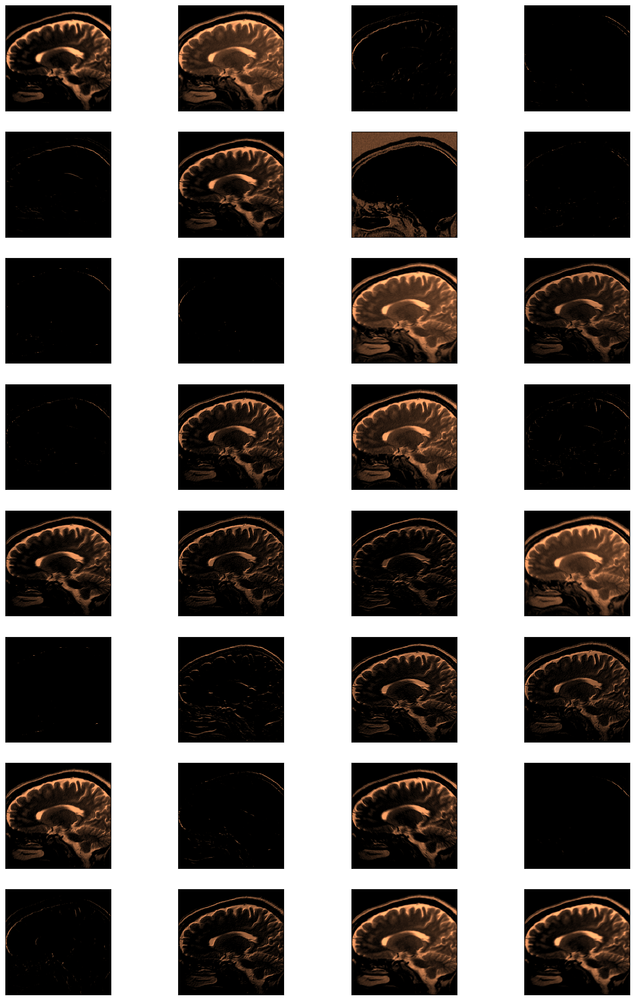

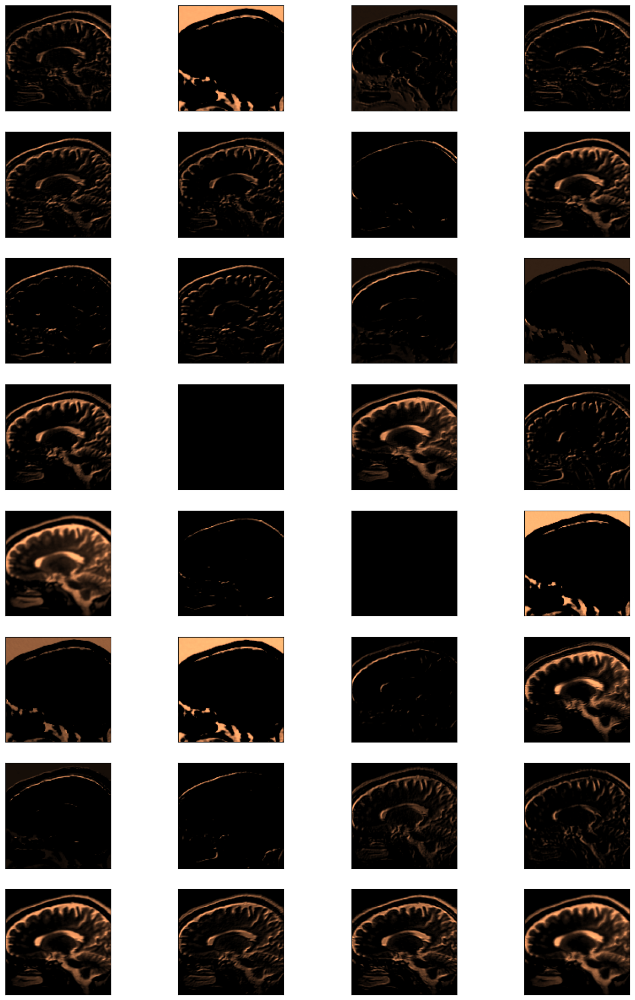

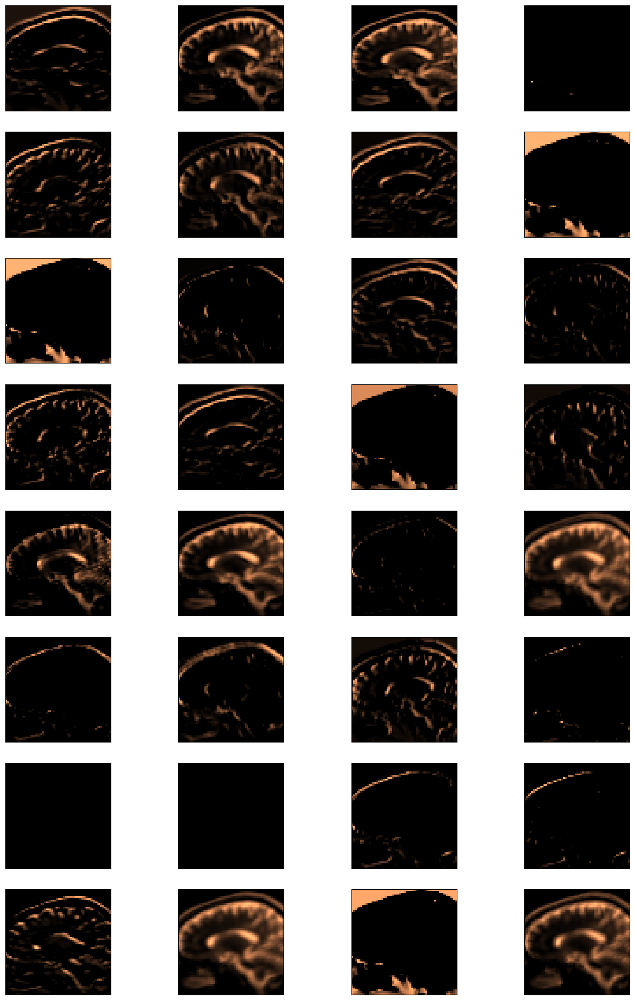

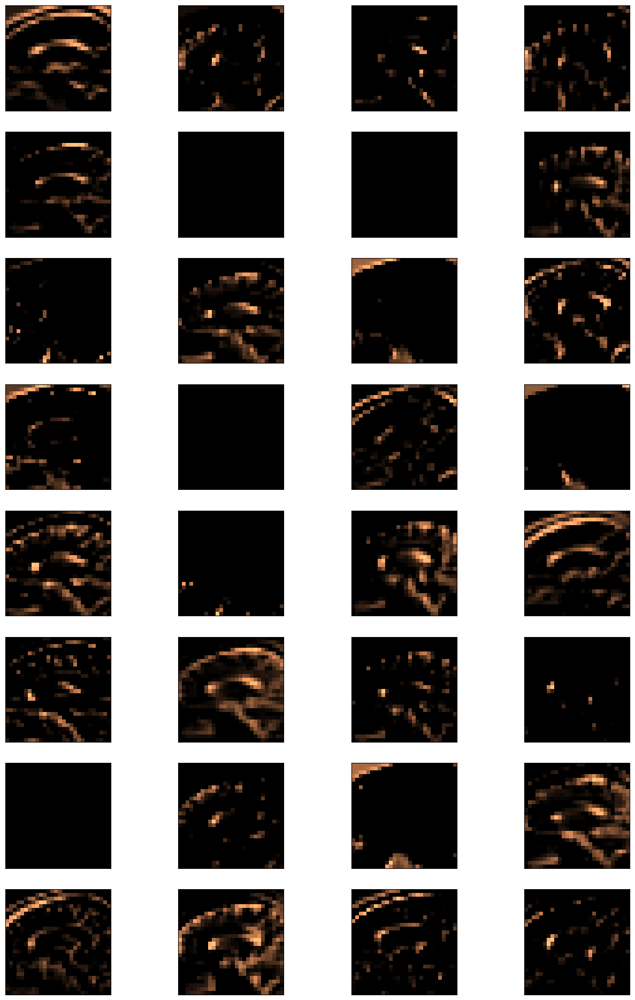

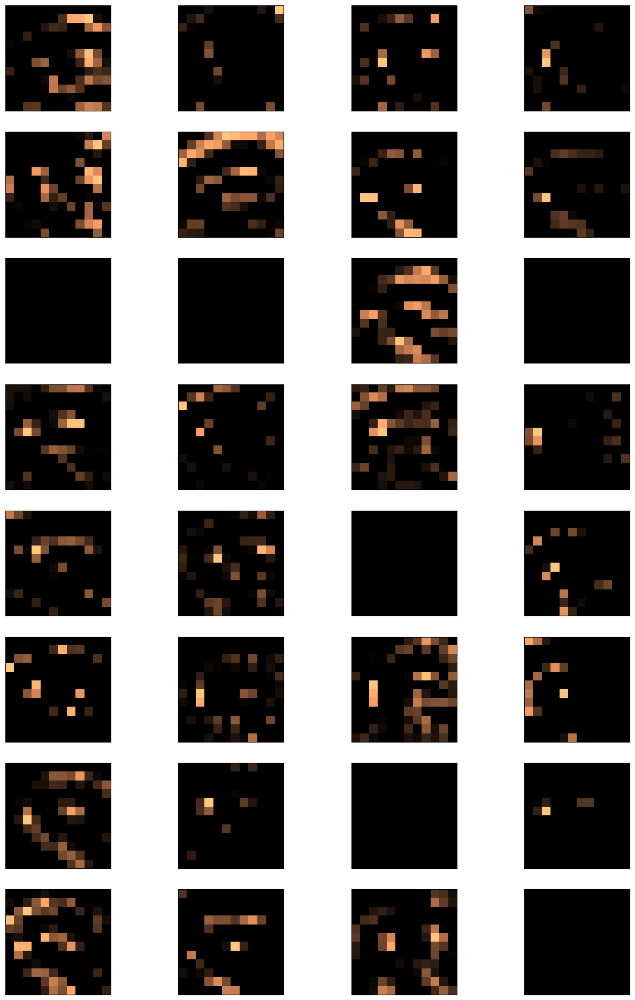

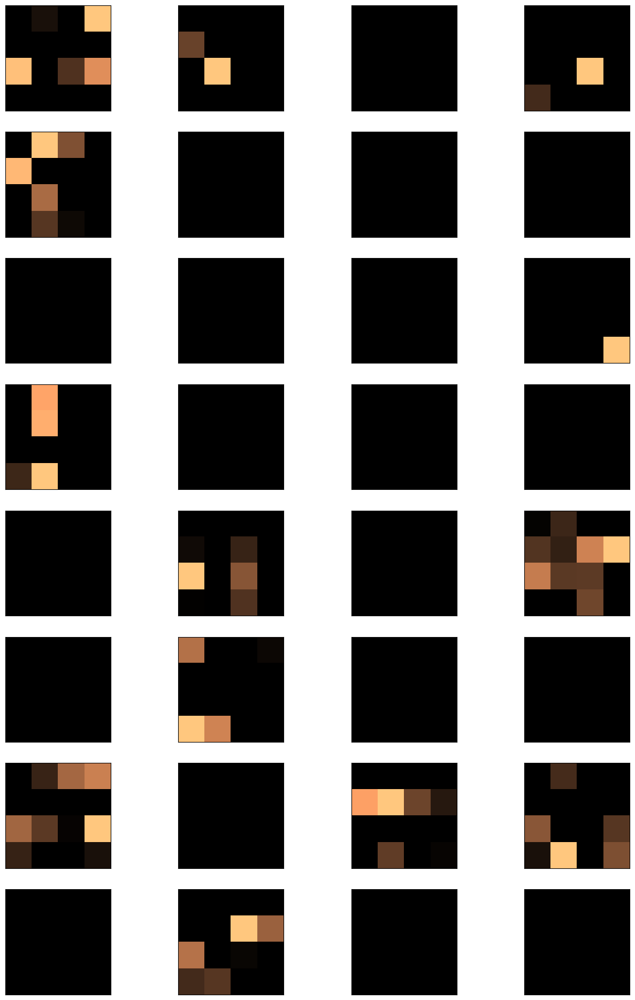

In [111]:
from tensorflow.keras.utils import load_img, img_to_array
img = load_img("./Testing/notumor/Te-no_0013.jpg", target_size=(256, 256)) 
img = img_to_array(img)
img = np.expand_dims(img, axis=0)
feature_output = model_short.predict(img)
columns = 4
rows = 8
for ftr in feature_output:
    fig=plt.figure(figsize=(16, 24))
    for i in range(1, columns*rows +1):
        fig =plt.subplot(rows, columns, i)
        fig.set_xticks([])
        fig.set_yticks([])
        plt.imshow(ftr[0, :, :, i-1], cmap='copper')
    plt.show()

## Saving the Model

In [ ]:
# model_version=([2 in os.listdir("./models") + [0]])
# model.save(f"./models/{model_version}")

# model.save(f"./models/brain_tumor_model.h5")